# 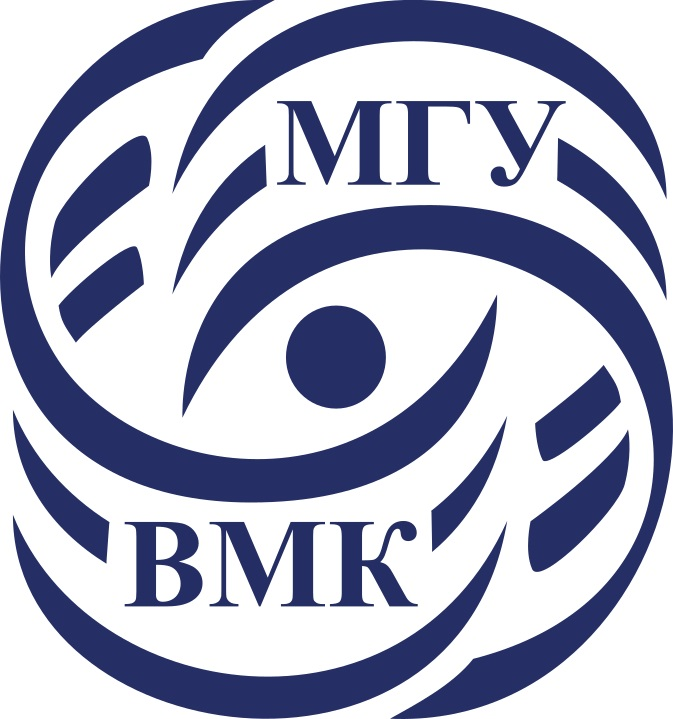

# Машинное обучение. ВМК МГУ

# Практическое задание 7: Кластеризация. Методы снижения размерности.
## Уровень: <font color='MediumSeaGreen'>**Исследовательский (Research)**</font>





# О формате сдачи

🔷 **<font color='plum'>При решении ноутбука используйте данный шаблон</font>**

    ✅ Можно добавлять новые ячейки любых типов
    ❌ Не нужно удалять текстовые ячейки c разметкой частей ноутбука и формулировками заданий


🔷 **<font color='plum'>При оценивании задач учитывается код</font>**

    ✅ Задания, в которых необходим код, обычно помечаются фразами "Your code here"/"Ваш код" и аналогичными
    ❌ Ответы на вопросы без сопутствующего кода оцениваются в 0 баллов
    ❌ Наличе работоспособного кода в ноутбуке, если на сказано иного, обязательно

🔷 **<font color='plum'>При оценивании задач учитываются выводы</font>**

    ✅ Задания, в которых необходимы выводы, обычно помечаются фразами Вывод"/"Ответ на вопрос"/"Ваш текст" и аналогичными
    ✅ Обычно выводы подразумевают под собой текстовый ответ (можно писать markdown, latex).
    ✅ Сопутствующие изображения, графики, таблички - приветствуются!
    ❌ При отсутствии выводов задание не засчитается на полный балл

-----------
<font color="white" style="opacity:0.2024"></font>







__В этом задании вы..:__

* Познакомитесь с одним способом визуализации процесса обучения
* Сравните между собой результаты разных способов кластеризации
* Посмотрите и реализуете несколько метрик качества кластеризации
* Попробуете разные методы снижения размерности

----

<font color="white" style="opacity:0.2024"></font>
<font color=DarkOrange>**Примерное время выполнения (execution time/время выполнения, если нажать run all) всех ячеек ноутбука при правильной реализации: 60 минут </font>**

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

Перед началом выполнения переведите ноутбук в `Доверенный режим` (`Trusted`) для корректного отображения изображений:

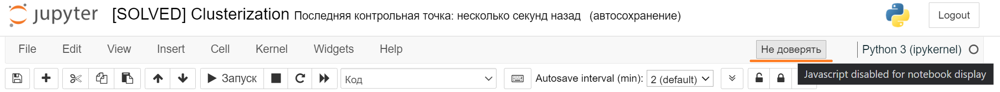

In [ ]:
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# Подготовка рабочей среды

Сначала установим нужные нам версии библиотек. Мы гарантируем, что в данных версиях задание будет корректно отрабатывать.

После установки нужных версий, **возможно,** нужно перезагрузить среду (runtime), но скорее всего вам это не понадобится


На скачивание файла и установку понадобится не более 5 минут.

<font color='OrangeRed'>**Важно!**</font>

Устанавливать нужные версии нужно каждый раз, когда создается новый рантайм. Например, если вы 2 часа подряд делаете это задание, то подготовить библиотеки достаточно 1 раз. Но если вы, например, начали в понедельник, затем закрыли/выключили ноутбук, то при продолжении в среду, вам нужно будет запустить рантайм заново и следовательно заново установить библиотеки.

<font color='OrangeRed'>**Важно!**</font>
Если вы предпочитаете делать практические задания на своем личном ноутбуке, то проверьте, что вы установили рабочее окружение в [соответствии с гайдом](https://github.com/MSU-ML-COURSE/ML-COURSE-24-25/blob/main/tutorials/%D0%A2%D1%83%D1%82%D0%BE%D1%80%D0%B8%D0%B0%D0%BB%20%D0%BF%D0%BE%20%D1%83%D1%81%D1%82%D0%B0%D0%BD%D0%BE%D0%B2%D0%BA%D0%B5%20%D1%80%D0%B0%D0%B1%D0%BE%D1%87%D0%B5%D0%B3%D0%BE%20%D0%BE%D0%BA%D1%80%D1%83%D0%B6%D0%B5%D0%BD%D0%B8%D1%8F%20%D0%B2%20Python%20%D0%B4%D0%BB%D1%8F%20%D1%80%D0%B5%D1%88%D0%B5%D0%BD%D0%B8%D1%8F%20%D0%B7%D0%B0%D0%B4%D0%B0%D1%87%20(2).pdf)

-----

<font color='OrangeRed'>**Важно!**</font> В этом задании мы будем использовать полное виртуальное окружение, так как понадобятся библиотеки `torch` и `tensorflow`

Обратите внимание, что установка `torch` и `tensorflow` через `pip `может сломать ваше окружение, особенно если вы используете GPU. Выполняйте их установку в соответствии с Вашей конфигурацией системы или в отдельном виртуальном окружении

In [ ]:
# !!! Данный блок будет работать только в Google-Colab !!!
! gdown 19ZRLAdlNBI5OScrbxXzO3iaWJSkJlXeA
! pip install -r /content/requirements_2024_25_for_colab_full.txt

In [ ]:
import catboost
assert(catboost.__version__ == '1.2.7')

Теперь можно приступать к выполнению задания! :)

-----------
<font color="white" style="opacity:0.2024"></font>

# 1 О задании

В данной работе вам предстоит познакомится с методами машинного обучения без учителя — кластеризацией и алгоритмами снижения размерности.

Рекомендуется использовать Kaggle так как в нём корректно работают интерактивные визуализации.

Здесь перечислены основные функции и библиотеки, которые могут понадобиться Вам в процессе выполнения задания. Подключение других библиотек возможно, но нежелательно. **Работа каких-либо других библиотек не гарантируется.**

In [ ]:
import os

import gdown

import scipy

import numpy as np

import tqdm.auto as tqdm

import matplotlib
import matplotlib.pyplot as plt
from matplotlib.offsetbox import OffsetImage, AnnotationBbox

from ipywidgets import interactive, fixed, interact_manual, IntSlider, FloatLogSlider, FloatSlider

import torch
from torchvision.datasets import CIFAR10

# Необходима преварительная установка tensorflow
from keras.applications.inception_v3 import InceptionV3, preprocess_input

import sklearn

from sklearn.decomposition import KernelPCA
from sklearn.cluster import KMeans, DBSCAN, AgglomerativeClustering

# Библиотека umap-learn, а не umap
from umap import UMAP
from sklearn.manifold import TSNE, Isomap

from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification, make_moons, make_blobs
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.metrics import pairwise_distances
from sklearn.metrics.pairwise import rbf_kernel

from tqdm.auto import tqdm

from warnings import simplefilter
from sklearn.exceptions import ConvergenceWarning
simplefilter("ignore", category=ConvergenceWarning)

Определим вспомогательную функцию для отрисовки двумерных кластеризованных данных. При выполенении задания желательно пользоваться этой функцией для визуализации. При необходимости можете менять сигнатуру и поведение функции как вам удобно, _оставляя стиль отрисовки в целом неизменным_.

In [ ]:
def plot_2d_data(data, labels, title="Исходные данные", cmap="tab20", ax=None):
    """
    Отрисовка 2d scatter plot.
    :param np.ndarray data: 2d массив точек
    :param Union[list, np.ndarray] labels: список меток для каждой точки выборки
    :param str title: Заголовок графика
    :param str cmap: Цветовая палитра
    :param ax Optional[matplotlib.axes.Axes]: Оси для отрисовки графика.
        Если оси не заданы, то создаётся новая фигура и сразу же происходит её отрисовка
        Иначе, график добавляется на существуюущие оси. Отрисовки фигуры не происходит
    """
    n_clusters = len(np.unique(labels))

    if ax is None:
        fig, ax = plt.subplots(1, 1, figsize=(8, 5))
    else:
        fig = None

    scatter = ax.scatter(
        data[:, 0], data[:, 1], c=labels, cmap=plt.get_cmap(cmap, n_clusters)
    )

    cbar = plt.colorbar(scatter, label="Cluster Number", ax=ax)
    if n_clusters > 10:
        ticks = np.linspace(np.min(labels), np.max(labels), 10)
        cbar.set_ticks(ticks)
        cbar.set_ticklabels([f'{int(t)}' for t in ticks])
    else:
        cbar.set_ticks(
            np.min(labels) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters
        )
        cbar.set_ticklabels(np.unique(labels))

    ax.set_title(title)
    ax.grid(True)

    if fig is not None:
        fig.tight_layout()
        plt.show()

Также используйте написанные реализации из [Base] задания:

In [ ]:
def silhouette_score(x, labels):
    labels = np.array(labels)
    n = len(labels)

    unique_labels, inverse = np.unique(labels, return_inverse=True)
    n_clusters = len(unique_labels)

    if n_clusters == 1:
        return 0.0

    D = pairwise_distances(x)

    mask = np.zeros((n, n_clusters), dtype=bool)
    mask[np.arange(n), inverse] = True

    cluster_sizes = mask.sum(axis=0)

    sum_intra = (D * mask.T[inverse]).sum(axis=1)
    sizes = cluster_sizes[inverse]
    s = np.zeros(n)
    mask_single = sizes == 1
    mask_multi = ~mask_single
    s[mask_multi] = sum_intra[mask_multi] / (sizes[mask_multi] - 1)
    s[mask_single] = 0.0

    avg_dist_to_clusters = D @ mask / cluster_sizes
    avg_dist_to_clusters[np.arange(n), inverse] = np.inf
    d = np.min(avg_dist_to_clusters, axis=1)

    sil = np.zeros(n)
    mask_single_cluster = cluster_sizes[inverse] == 1
    sil[mask_single_cluster] = 0
    mask_zero = (s == 0) & (d == 0) & ~mask_single_cluster
    mask_nonzero = ~mask_zero & ~mask_single_cluster
    sil[mask_zero] = 0.0
    sil[mask_nonzero] = (d[mask_nonzero] - s[mask_nonzero]) / np.maximum(d[mask_nonzero], s[mask_nonzero])

    return np.mean(sil)

def bcubed_score(true_labels, predicted_labels):
    true_labels = np.array(true_labels)
    predicted_labels = np.array(predicted_labels)
    n = len(true_labels)

    correctness_matrix = np.equal.outer(predicted_labels, predicted_labels) & np.equal.outer(true_labels, true_labels)

    cluster_sizes = np.sum(np.equal.outer(predicted_labels, predicted_labels), axis=1)
    precision_bcubed_per_object = np.sum(correctness_matrix, axis=1) / cluster_sizes

    gold_sizes = np.sum(np.equal.outer(true_labels, true_labels), axis=1)
    recall_bcubed_per_object = np.sum(correctness_matrix, axis=0) / gold_sizes

    precision_bcubed = np.mean(precision_bcubed_per_object)
    recall_bcubed = np.mean(recall_bcubed_per_object)

    if precision_bcubed + recall_bcubed == 0:
        return 0.0

    return 2 * (precision_bcubed * recall_bcubed) / (precision_bcubed + recall_bcubed)

## 1.1 Ещё несколько важных замечаний

При выполнении задания запрещено:
1. Менять те seed, которые явно указаны в коде
2. Менять прототипы функций, классов, методов классов
3. Менять константы, используемые для генерации выборок

При оформлении задания обратите внимание на форматирование кода и на оформление графиков:

* Весь код должен быть оформлен в строгом соответствии с [PEP8](https://pep8.org/)

Графики должны быть с одной стороны понятными и информативными, а с другой стороны *красивыми*. Вот несколько пунктов, которые помогут удовлетворить этим требования:
1. Все графики должны быть отрисованы в **векторном формате**. Обратите внимание, что смена режима графиков с динамического на статический и обратно может приводить к сбросу параметров отрисовки графиков. Переход в векторный режим можно выполнить с помощью команды `matplotlib_inline.backend_inline.set_matplotlib_formats('pdf', 'svg')`. Если изображения в векторном формате приводят к слишком большому размеру Jupyter Notebook можете использовать растровые изображения с **высоким dpi**. Напирмер, можно установить глобальный dpi в matplotlib: `matplotlib.rcParams['figure.dpi'] = 300`
2. На всех графиках без исключения должна быть нарисована сетка
3. Все графики и группы графиков должны иметь заголовок (`title`)
4. При необходимости оси должны быть подписаны
5. Если на графике отображено несколько сущностей (линии/точки/bar разных цветов, формы и так далее), то необходима исчерпывающая легенда
6. Все линии на графиках должны быть чётко видны (нет похожих цветов или цветов, сливающихся с фоном и так далее)
7. Масштаб по каждой оси на графике должен быть выбран правильно. Используйте масштабы `log`, `symlog` по необходимости
8. Если отображена величина, имеющая очевидный диапазон значений (например, проценты могут быть от 0 до 100), то желательно масштабировать ось на весь диапазон значений (исключением является случай, когда вам необходимо показать малое отличие, которое незаметно в таких масштабах)
9. Частота отметок по каждой оси должна быть тщательно подобрана, по необходимости задавайте `[xy]ticks`, `[xy]ticklabels` вручную. Подписи тиков на осях не должны сливаться как на одной оси, так и между ними
10. Помните, что matplotlib умеет выполнять [рендеринг Latex](https://matplotlib.org/stable/gallery/text_labels_and_annotations/tex_demo.html). Используйте эту возможность для написания формул в заголовках, легенде и в подписях осей
11. Используйте *красивую* цветовую палитру с хорошо различимыми цветами. Примеры цветовых палитр можно посмотреть [здесь](https://matplotlib.org/stable/gallery/color/colormap_reference.html). При наличи особенностей восприятия цвета можно использовать специальные палитры:
```python
plt.style.use('seaborn-colorblind')
# Или
plt.style.use('tableau-colorblind10')
# Затем, при отрисовке графиков не используйте параметр cmap
```
12. Графики должны быть не супер-микро и не супер-макро по размерам, так, чтобы можно было увидеть все, что нужно

----------------------------------------------
<font color="white" style="opacity:0.2023"></font>

# <font color='DarkOrange'>2. Кластеризация "естественных" данных.</font>

Синтетические данные имеют достаточно простую структуру, поэтому методы снижения размерности позволяют получать хорошее низкоразмерное представление с достаточно выраженными кластерами. Однако, реальные данные могут быть устроены существенно сложнее. Посмотрим как поведут себя методы снижения размерности на датасете с картинками CIFAR10.

Загрузим датасет. Будем использовать только часть обучающей выборки, чтобы ускорить вычисления на высокоразмерных данных.

In [ ]:
cifar10_test_dataset = CIFAR10('./cifar10', train=False, download=True)
cifar10_train_dataset = CIFAR10('./cifar10', train=True, download=False)

cifar10_labels_test = np.array(cifar10_test_dataset.targets)
cifar10_labels_train = np.array(cifar10_train_dataset.targets)

cifar10_images_test = cifar10_test_dataset.data
cifar10_images_train = cifar10_train_dataset.data

cifar10_images_train, _, cifar10_labels_train, _ = train_test_split(
    cifar10_images_train, cifar10_labels_train,
    train_size=cifar10_images_test.shape[0], stratify=cifar10_labels_train, random_state=6886
)

cifar10_data_test = (cifar10_images_test.astype(np.float32) / 255.0).reshape([cifar10_images_test.shape[0], -1])
cifar10_data_train = (cifar10_images_train.astype(np.float32) / 255.0).reshape([cifar10_images_train.shape[0], -1])

100%|██████████| 170498071/170498071 [00:02<00:00, 61731064.71it/s]


Extracting ./cifar10/cifar-10-python.tar.gz to ./cifar10


In [ ]:
print(cifar10_data_train.shape)
print(cifar10_data_test.shape)

(10000, 3072)
(10000, 3072)


Отобразим данные в проекции на две случайные оси. Для удобства воспользуемся здесь ещё одним вариантом динамического контента в jupyter notebook — при наведении на точку на графике будем отображать исходную картинку.

In [ ]:
def plot_interactive(lowd_data, images, labels, names, n_dots=1000, image_scale=1.0):
    with matplotlib.rc_context(rc={
        'font.size': image_scale * matplotlib.rcParams['font.size'],
        'xtick.major.size': image_scale * matplotlib.rcParams['xtick.major.size'],
        'xtick.minor.size': image_scale * matplotlib.rcParams['xtick.minor.size'],
        'ytick.major.size': image_scale * matplotlib.rcParams['ytick.major.size'],
        'ytick.minor.size': image_scale * matplotlib.rcParams['ytick.minor.size'],

        'axes.linewidth': image_scale * matplotlib.rcParams['axes.linewidth'],
        'grid.linewidth': image_scale * matplotlib.rcParams['grid.linewidth'],
        'patch.linewidth': image_scale * matplotlib.rcParams['patch.linewidth'],
        'xtick.major.width': image_scale * matplotlib.rcParams['xtick.major.width'],
        'xtick.minor.width': image_scale * matplotlib.rcParams['xtick.minor.width'],
        'ytick.major.width': image_scale * matplotlib.rcParams['ytick.major.width'],
        'ytick.minor.width': image_scale * matplotlib.rcParams['ytick.minor.width'],

        'lines.markeredgewidth': image_scale * matplotlib.rcParams['lines.markeredgewidth'],
    }):
        fig, ax = plt.subplots(1, 1, figsize=(image_scale * 10, image_scale * 5))
        fig.set_dpi(300)
        ax.grid(True)

        n_clusters = len(np.unique(labels))

        scatter = plt.scatter(
            lowd_data[:n_dots, 0], lowd_data[:n_dots, 1], s=image_scale * 10,
            c=labels[:n_dots], cmap=plt.get_cmap('tab20', n_clusters), edgecolors='none'
        )

        cbar = plt.colorbar(scatter, ax=ax, label='Название кластера')
        cbar.set_ticks(np.min(labels[:n_dots]) + (np.arange(n_clusters) + 0.5) * (n_clusters - 1) / n_clusters)
        cbar.set_ticklabels(names)

        offset_image = OffsetImage(images[0], zoom=image_scale * 2.0)
        ann_bbox = AnnotationBbox(
            offset_image, (0,0), xybox=(image_scale * 50., image_scale * 50.), xycoords='data',
            boxcoords="offset points", pad=0.3, arrowprops=dict(
                arrowstyle='->, head_length={0:.2f}, head_width={1:.2f}'.format(
                    image_scale * 0.4, image_scale * 0.2
                )
            )
        )
        ax.add_artist(ann_bbox)
        ax.set_title('Распределение данных CIFAR10 в проекции на 2 случайные оси')
        ann_bbox.set_visible(False)

        def image_hover(event):
            if scatter.contains(event)[0]:
                ind, *_ = scatter.contains(event)[1]["ind"]
                w, h = fig.get_size_inches() * fig.dpi
                ws = (event.x > w / 2.) * -1 + (event.x <= w / 2.)
                hs = (event.y > h / 2.) * -1 + (event.y <= h / 2.)
                ann_bbox.xybox = (image_scale * 50.0 * ws, image_scale * 50.0 * hs)
                ann_bbox.set_visible(True)
                ann_bbox.xy =(lowd_data[ind, 0], lowd_data[ind, 1])
                offset_image.set_data(images[ind])
            else:
                ann_bbox.set_visible(False)
            fig.canvas.draw_idle()

        fig.canvas.mpl_connect('motion_notify_event', image_hover)

        plt.show()

In [ ]:
%matplotlib ipympl
matplotlib.rcParams['figure.dpi'] = 300

# Для работы в Google Colab нужно выполнить специфичную магию
# Обычно, она не срабатывает с первого раза, поэтому может потребоваться
# несколько раз выполнить ячейку и несколько раз попробовать нарисовать график
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except:
    pass

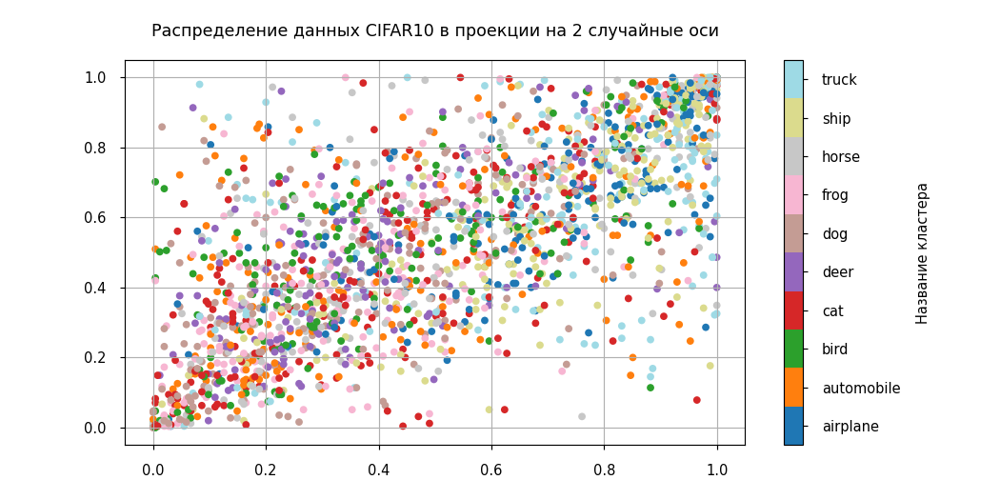

In [ ]:
# Если картинка окажется слишком маленькой/большой, то поменяйте image_scale на подходящее значение
plot_interactive(
    cifar10_data_train[:, [17, 64]], cifar10_images_train, cifar10_labels_train,
    cifar10_test_dataset.classes, n_dots=2000, image_scale=0.35
)

Вернёмся в статичный режим отрисовки изображений:

In [ ]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300

#### <font color='DarkOrange'>**Задание 2.1 [кросспроверка, 1 балл][код]**</font>
Воспользуйтесь алгоритмами снижения размерности `TSNE`, `UMAP`, `Isomap`, `KernelPCA` для визуализации картинок.

Постройте визуализацию низкоразмерного представления, полученного с помощью этих моделей — изобразите четыре графика в одной строке. Во второй строке отобразите результат применения обученных моделей на тестовой выборке. Если для данного алгоритма невозможно сделать предсказания на тестовой выборке — оставьте соответствующий график пустым. Обозначьте разными цветами разные классы объектов. Для повышения производительности можете отобразить только часть выборки на графике ($1000\text{-}2000$ объектов).

<font color='OrangeRed'>**Замечание:**</font>  обратите внимание, что все алгоритмы снижения размерности также требуют правильного масштабирования признаков, для корректной работы и интерпретируемых результатов.

In [ ]:
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(cifar10_data_train)
X_test_scaled = scaler.transform(cifar10_data_test)

methods = {
    'TSNE': TSNE(n_components=2, random_state=42),
    'UMAP': UMAP(n_components=2, random_state=42),
    'Isomap': Isomap(n_components=2),
    'KernelPCA': KernelPCA(n_components=2, kernel='rbf', random_state=42)
}

In [ ]:
trained_models = {}

for name, model in tqdm(methods.items(), desc='Training', total=len(methods)):
    embedding_train = model.fit_transform(X_train_scaled)
    trained_models[name] = (model, embedding_train)

Training:   0%|          | 0/4 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


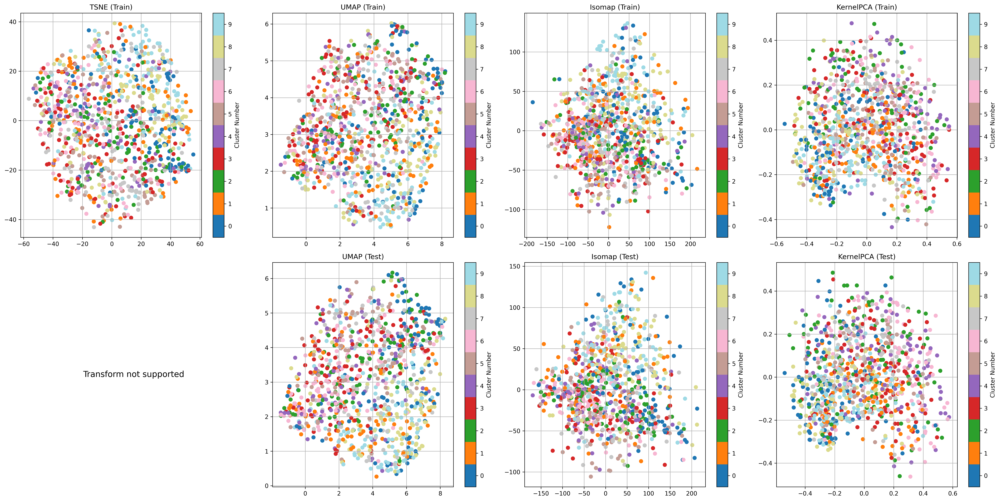

In [ ]:
n_vis = 1000

fig, axes = plt.subplots(2, 4, figsize=(24, 12))

for i, (name, (model, embedding_train)) in enumerate(trained_models.items()):
    # train data
    plot_2d_data(
        embedding_train[:n_vis],
        cifar10_labels_train[:n_vis],
        title=f'{name} (Train)',
        ax=axes[0, i]
    )

    # test data
    if name == 'TSNE':
        axes[1, i].axis('off')
        axes[1, i].text(0.5, 0.5, 'Transform not supported', ha='center', va='center', fontsize=14)
    else:
        embedding_test = model.transform(X_test_scaled)
        plot_2d_data(
            embedding_test[:n_vis],
            cifar10_labels_test[:n_vis],
            title=f'{name} (Test)',
            ax=axes[1, i]
        )

plt.tight_layout()
plt.show()

#### <font color='DarkOrange'>**Задание 2.2 [кросспроверка, 1 балл][вопрос]**</font>
Опишите увиденное. Почему алгоритмы могли отработать не так, как вы ожидали?

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

На графиках видно, что при снижении размерности исходных данных классы не образуют чётких кластеров: объекты разных классов сильно перемешаны, структура данных не особо прослеживается, по такой визуализации трудно что-то понять о том, как устроены данные

Возможные причины:
*   **Высокая размерность и проклятие размерности**  
Исходные данные — это изображения, представленные вектором длины 3072 признака (каждый признак соответствует значению интенсивности отдельного пикселя определённого цветового канала: R, G или B). В таком высокоразмерном пространстве расстояния между точками становятся менее информативными, и алгоритмы снижения размерности испытывают сложности с выявлением реальной структуры
*   **Сложная структура данных и отсутствие информативных признаков**  
Все эти методы снижения размерности требуют наличия хотя бы минимальной структуры или информативных признаков в данных. Однако пиксели сами по себе не содержат абстрактной информации о том, как устроено содержимое картинки. Пиксели отражают только локальные значения цвета, а не форму, структуру или смысл объектов, поэтому алгоритмы не видят различий между классами — ведь изображения разных классов могут даже иметь похожие распределения пиксельных значений, особенно если объекты расположены по-разному, имеют разный фон, освещение и т.п. Это мешает алгоритмам выделить чёткие кластеры, поскольку отсутствуют устойчивые информативные признаки, по которым можно было бы выявить эту кластерную структуру. Вместе с этим не приходится и говорить о линейности или наличии гладкого многообразия в данных
*   **Недостаточная предобработка**  
То есть из предыдущего пункта следует, что для таких данных нужна более сложная предобработка. Например, выделение границ, фильтрация шумов, предварительное обучение/выделение некоторых более устойчивых, информативных и
высокоуровневых признаков. Такие признаки, например, формируют сверточные нейронные сети, которые автоматически извлекают на ранних слоях простые паттерны (границы, углы, линии, текстуры), а на более глубоких слоях — абстрактные представления, связанные с отдельными частями объектов и их формой
*   **Параметры алгоритмов**  
Вообще говоря, для алгоритмов снижения размерности тоже необходимо подбирать параметры. Это может немного помочь, но это не решит фундаментальной проблемы отсутствия информативных признаков


#### <font color='DarkOrange'>**Задание 2.3 [кросспроверка, 1 балл][вопрос]**</font>
Методы снижения размерности, как и другие метрические методы испытывают трудности при работе с данными высокой размерности. Напишите как минимум две причины, почему.

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

*   Проклятие размерности: расстояния между объектами становятся менее информативными
*   Разреженность данных: объекты разбросаны по пространству, что затрудняет выявление локальной структуры
*   Шум и нерелевантные признаки: мешают выделению полезной информации
*   Рост вычислительной сложности: алгоритмы требуют все бо́льших ресурсов
*   Неявные предположения о структуре данных: методы предполагают линейность или гладкость, что часто не выполняется для высокоразмерных данных

Более подробные пояснения даны в предыдущем пункте



Один из способов решения этих проблем — перейти в другое, более репрезентативное пространство признаков, где объекты будут расположены в многообразии, которое легче представить в двумерном пространстве. Чтобы выполнить такое преобразование воспользуемся типичным подходом **Transfer Learning** — предобученными нейронными сетями. С помощью глубокой сети обученной на другом наборе изображений (`ImageNet`) мы перейдём в новое векторное пространство и затем применим методы снижения размерности.

Так как локальный подсчёт эмбеддингов изображений может занять много времени, Вы можете попробовать скачать их c помощью `gdown`:

In [ ]:
gdown.download(id='16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-', output='cifar10_deep_features.npy')

Downloading...
From (original): https://drive.google.com/uc?id=16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-
From (redirected): https://drive.google.com/uc?id=16UgWo1Emt9ar1O4h2Xxed0ZpJZ0OG5V-&confirm=t&uuid=6b8dcee2-a111-4c64-970b-211b9b7c4da8
To: /content/cifar10_deep_features.npy
100%|██████████| 164M/164M [00:02<00:00, 68.5MB/s]


'cifar10_deep_features.npy'

In [ ]:
FEATURES_PATH = './cifar10_deep_features.npy'

if not os.path.exists(FEATURES_PATH):
    deep_cnn = InceptionV3(weights='imagenet', include_top=False, input_shape=(139, 139, 3))

    cifar10_tensors_test = torch.nn.functional.interpolate(torch.tensor(
        cifar10_images_test.transpose(0, 3, 1, 2)
    ), size=139).numpy().transpose(0, 2, 3, 1).astype(np.float32)
    cifar10_tensors_train = torch.nn.functional.interpolate(torch.tensor(
        cifar10_images_train.transpose(0, 3, 1, 2)
    ), size=139).numpy().transpose(0, 2, 3, 1).astype(np.float32)

    cifar10_deep_features_test = deep_cnn.predict(
        preprocess_input(cifar10_tensors_test)
    ).mean(axis=(1, 2)).reshape([cifar10_tensors_test.shape[0], -1])
    cifar10_deep_features_train = deep_cnn.predict(
        preprocess_input(cifar10_tensors_train)
    ).mean(axis=(1, 2)).reshape([cifar10_tensors_train.shape[0], -1])

    np.save(FEATURES_PATH, [cifar10_deep_features_test, cifar10_deep_features_train])
else:
    cifar10_deep_features_test, cifar10_deep_features_train = np.load(FEATURES_PATH, allow_pickle=True)

In [ ]:
print(cifar10_deep_features_train.shape)
print(cifar10_deep_features_test.shape)

(10000, 2048)
(10000, 2048)


#### <font color='DarkOrange'>**Задание 2.4 [кросспроверка, 2 баллa][код]**</font>
Используйте выделенные признаки для обучения алгоритмов из предыдущего пункта. Постройте графики. Замечание из пункта [**2.1**](#task_2.1) остаётся в силе.

In [ ]:
scaler = StandardScaler()
X_train_deep_scaled = scaler.fit_transform(cifar10_deep_features_train)
X_test_deep_scaled = scaler.transform(cifar10_deep_features_test)

methods = {
    'TSNE': TSNE(n_components=2, random_state=42),
    'UMAP': UMAP(n_components=2, random_state=42),
    'Isomap': Isomap(n_components=2),
    'KernelPCA': KernelPCA(n_components=2, kernel='rbf', random_state=42)
}

In [ ]:
trained_models_deep = {}

for name, model in tqdm(methods.items(), desc='Training', total=len(methods)):
    embedding_train = model.fit_transform(X_train_deep_scaled)
    trained_models_deep[name] = (model, embedding_train)

Training:   0%|          | 0/4 [00:00<?, ?it/s]

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


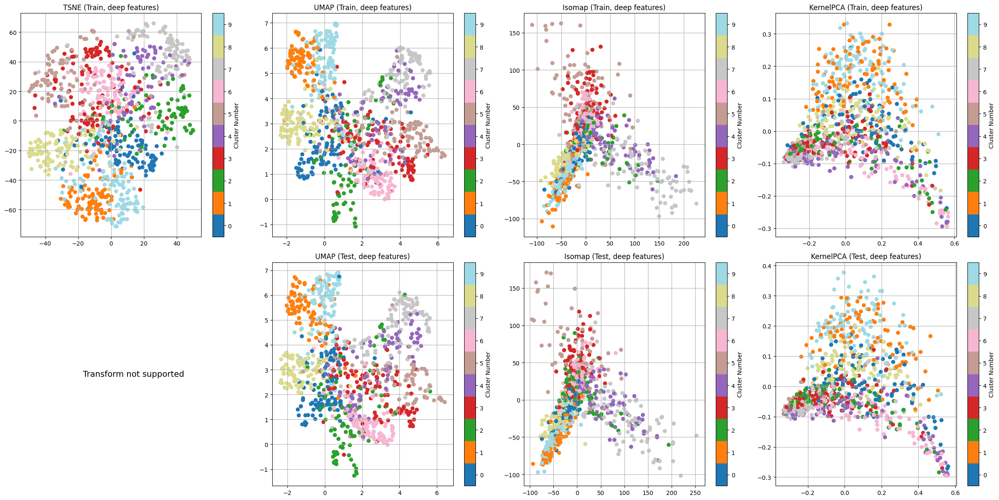

In [ ]:
n_vis = 1000

fig, axes = plt.subplots(2, 4, figsize=(24, 12))

for i, (name, (model, embedding_train)) in enumerate(trained_models_deep.items()):
    # train data
    plot_2d_data(
        embedding_train[:n_vis],
        cifar10_labels_train[:n_vis],
        title=f'{name} (Train, deep features)',
        ax=axes[0, i]
    )

    # test data
    if name == 'TSNE':
        axes[1, i].axis('off')
        axes[1, i].text(0.5, 0.5, 'Transform not supported', ha='center', va='center', fontsize=14)
    else:
        embedding_test = model.transform(X_test_deep_scaled)
        plot_2d_data(
            embedding_test[:n_vis],
            cifar10_labels_test[:n_vis],
            title=f'{name} (Test, deep features)',
            ax=axes[1, i]
        )

plt.tight_layout()
plt.show()

In [ ]:
def compute_mmd(X, Y, gamma=1.0):
    m, n = len(X), len(Y)
    XX = rbf_kernel(X, X, gamma=gamma).sum() / (m * m)
    YY = rbf_kernel(Y, Y, gamma=gamma).sum() / (n * n)
    XY = rbf_kernel(X, Y, gamma=gamma).sum() / (m * n)
    return XX + YY - 2 * XY

In [ ]:
for name in ['UMAP', 'Isomap', 'KernelPCA']:
    model, embedding_train = trained_models_deep[name]
    embedding_test = model.transform(X_test_deep_scaled)
    mmd_value = compute_mmd(embedding_train, embedding_test, gamma=1.0)
    print(f"{name}: MMD = {mmd_value:.6f}")

UMAP: MMD = 0.002419
Isomap: MMD = 0.000207
KernelPCA: MMD = 0.000005


#### <font color='DarkOrange'>**Задание 2.5 [кросспроверка, 1 балл][вопрос]**</font>
1. Есть ли какие-то изменения по сравнению с использованием исходных признаков?
2. Как вы думаете, почему использование глубоких признаков помогло/не помогло в задаче снижения размерности?
3. Какой алгоритм показал себя лучше на ваш взгляд?
4. Согласованы ли преобразования на обучающей и тестовых выборках? Какие недостатки есть в том, что преобразование на тестовой выборке выглядит отлично от низкоразмерного представления обучающей выборки?
5. Какие из алгоритмов можно использовать в качестве первого шага по снижению размерности в задачах машинного обучения? Какой из них использовали бы вы?

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

1. Да, теперь наблюдается явная структура: объекты одного класса группируются вместе, а между кластерами появляется более заметное разделение

2. Это помогло, потому что  эмбеддинги, в отличие от простых пиксельных значений, содержат в себе более агрегированную, высокоуровневую и релевантную для разделения классов информацию. Вместе с этим признаковое пространство стало более компактным (3072->2048) и гладким

3. На мой взгляд, лучше всего показал себя UMAP. Он хорошо разделил классы и сохранил общую структуру данных. Его визуализация достаточно понятная

4. Визуально для всех применимых алгоритмов классы на train и test выглядят похожим образом: объекты одного класса группируются примерно в тех же областях пространства, плотности точек похожи. И хотя некоторые классы чуть "расползаются" на test, сильных сдвигов или искажений нет, в целом структура похожа

    Также посчитаем MMD (Maximum Mean Discrepancy, это способ количественно оценить, насколько похожи два многомерных распределения). Полученные значения достаточно маленькие, что говорит о высокой схожести распределений train и test embeddings и, соответственно, согласованности преобразований

    Если после снижения размерности структура данных на test существенно отличается от train, то результаты преобразования плохо обобщаются и закономерности, выявленные на train, нельзя переносить на test, иначе это приведет к ошибкам и снижению качества при последующем анализе данных. В общем, чем больше несогласованность, тем осторожнее надо использовать метод на новых данных

5. Наиболее подходящим вариантом в данном случае мне кажется UMAP

    В целом:
    *   UMAP — лучший универсальный выбор: хорошо формирует кластеры, обобщает структуру, поддерживает transform, быстро работает
    *   KernelPCA полезен, если нужны ядровые методы; поддерживает transform, но обычно уступает UMAP по качеству кластеризации и скорости
    *   Isomap можно использовать только при подходящей структуре данных; кластеры часто менее чёткие, хуже масштабируется
    *   TSNE используется для визуализации, так как не поддерживает transform для новых данных


Далее, для визуализации кластеризации используйте один из методов снижения размерности на ваш выбор и то векторное представление, которое лучше всего себя проявило (исходное или полученное с помощью глубокой сети). Кластеризацию обучайте также на наиболее подходящем высокоразмерном векторном представлении.

#### <font color='DarkOrange'>**Задание 2.6 [кросспроверка, 1 балл][код, вопрос]**</font>
Изобразите выборку CIFAR10 с помощью выбранного алгоритма снижения размерности.

<font color='LightSteelBlue'>**Совет**</font> Изобразите результат с помощью `plot_interactive`, чтобы изучить особенности кластеризации в соответствии с исходными изображениями. Если вы нашли интересные особенности — напишите про это.

In [ ]:
%matplotlib ipympl
matplotlib.rcParams['figure.dpi'] = 300

# Для работы в Google Colab нужно выполнить специфичную магию
# Обычно, она не срабатывает с первого раза, поэтому может потребоваться
#   несколько раз выполнить ячейку и несколько раз попробовать нарисовать график
try:
    from google.colab import output
    output.enable_custom_widget_manager()
except:
    pass

/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


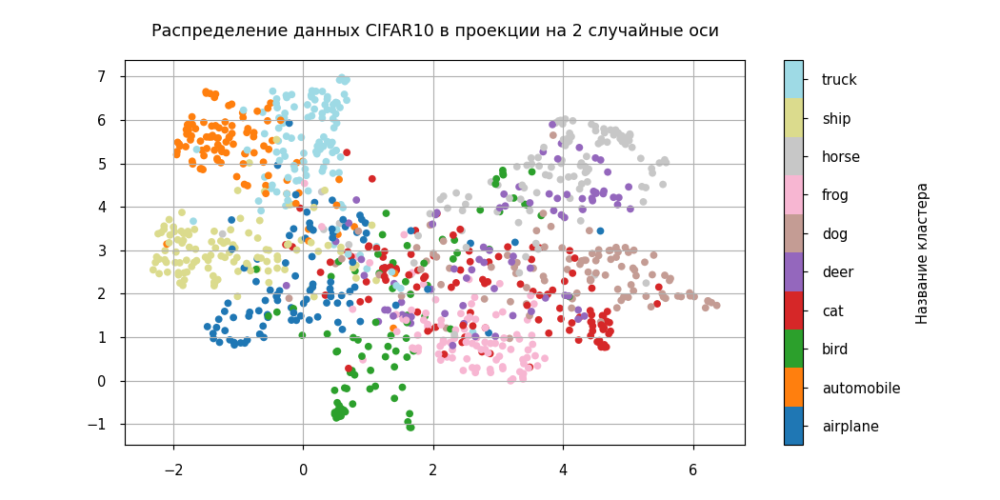

In [ ]:
scaler = StandardScaler()
umap = UMAP(n_components=2, random_state=42)
train_scaled = scaler.fit_transform(cifar10_deep_features_train)
embedding_train = umap.fit_transform(train_scaled)

plot_interactive(
    embedding_train, cifar10_images_train, cifar10_labels_train,
    cifar10_train_dataset.classes, n_dots=1000, image_scale=0.35
)

<font color='MediumOrchid'>**Ответ:**</font>

**Разделение на группы по типу объектов**  
Визуализация показывает разделение данных на две большие группы:
*   Искусственные средства передвижения (автомобили, грузовики, самолёты, корабли) в основном сосредоточены в левой части графика
*   Животные (лошади, олени, кошки, собаки, лягушки, птицы) расположены преимущественно справа

При этом наблюдается дополнительное соседство схожих классов в этих больших группах:
*   Лошади и олени находятся рядом, и это логично, учитывая то, что внешне они выглядят достаточно похоже
*   Кошки и собаки образуют близкие кластеры, отражая похожесть некоторых черт: ушки, мордочку и т.д.
*   Кластеры автомобилей и грузовиков по этой же логике находятся рядом. Грузовики по сути визуально можно рассматривать как крупные автомобили: у них есть колеса, а сама конструкция часто выражена определенными чёткими горизонтальными и вертикальными линиями

**Внутрикластерные особенности на примере птиц**  
Кластер птиц демонстрирует интересную структуру:
*   Маленькие птицы с выраженными крыльями расположены ближе к кластеру самолётов (слева внизу). Это отражает визуальное сходство в форме и структуре крыльев
*   Более крупные птицы с выраженными лапами находятся ближе к кластеру лошадей, у которых также выражены массивные ноги


**Характерные представители классов и пограничные объекты**  
Объекты, расположенные в наиболее плотном месте своего кластера, выглядят наиболее типично. Также они содержат меньше посторонних деталей и шумов, что делает их более узнаваемыми. А вот объекты на границах, как правило, содержат больше шума, деталей и неочевидных визуальных признаков

Вернёмся в статичный режим отрисовки изображений:

In [ ]:
%matplotlib inline
matplotlib.rcParams['figure.dpi'] = 300

Теперь, когда мы можем визуализировать кластеризацию, можно сравнить алгоритмы из первой части на естественных данных.

#### <font color='DarkOrange'>**Задание 2.7 [кросспроверка, 1.5 балла][код]**</font>
Подберите параметры `KMeans`, `DBSCAN`, `AgglomerativeClustering` используя силуэт и B-Cubed. Визуализируйте получившиеся кластеризации также, как и в задании **1.с.4** в ноутбуке [Base] Clusterizartion. Для ускорения перебора можете производить его на небольшой доле от всех объектов ($1000\text{-}2000$ объектов).

*Замечание:* Алгоритмы кластеризации нужно применять к исходному векторному представлению. Снижение размерности используется только для визуализации.

In [ ]:
n_samples = 1000
data_scaled = train_scaled[:n_samples]
labels = cifar10_labels_train[:n_samples]
embedding = embedding_train[:n_samples]

##### KMeans

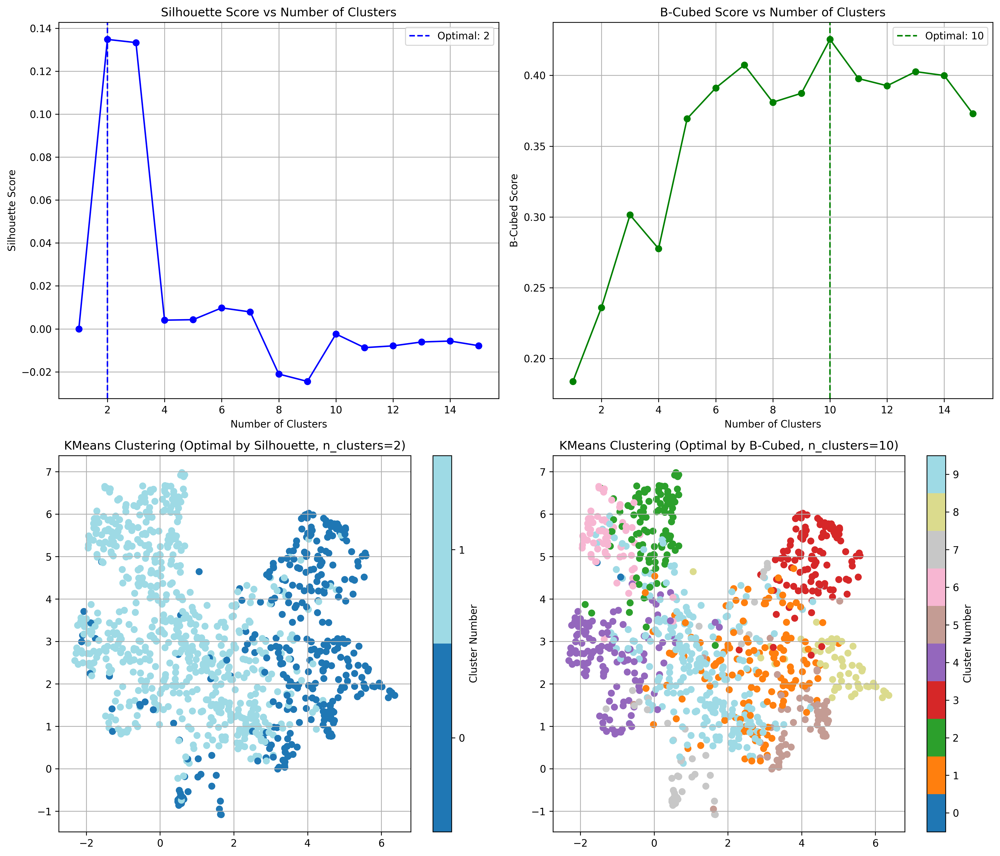

In [ ]:
n_clusters_range = range(1, 16)

silhouette_scores = []
bcubed_scores = []

for n_clusters in n_clusters_range:
    model = KMeans(n_clusters=n_clusters, n_init="auto", random_state=42)
    pred_labels = model.fit_predict(data_scaled)

    sil_score = silhouette_score(data_scaled, pred_labels)
    silhouette_scores.append(sil_score)

    b_score = bcubed_score(labels, pred_labels)
    bcubed_scores.append(b_score)

silhouette_scores = np.array(silhouette_scores)
best_sil_idx = np.argmax(silhouette_scores)
best_sil_clusters = n_clusters_range[best_sil_idx]

bcubed_scores = np.array(bcubed_scores)
best_bcubed_idx = np.argmax(bcubed_scores)
best_bcubed_clusters = n_clusters_range[best_bcubed_idx]

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

axes[0, 0].plot(n_clusters_range, silhouette_scores, marker="o", color="blue")
axes[0, 0].set_title("Silhouette Score vs Number of Clusters")
axes[0, 0].set_xlabel("Number of Clusters")
axes[0, 0].set_ylabel("Silhouette Score")
axes[0, 0].grid()
axes[0, 0].axvline(
    best_sil_clusters,
    color="blue",
    linestyle="--",
    label=f"Optimal: {best_sil_clusters}",
)
axes[0, 0].legend()

axes[0, 1].plot(n_clusters_range, bcubed_scores, marker="o", color="green")
axes[0, 1].set_title("B-Cubed Score vs Number of Clusters")
axes[0, 1].set_xlabel("Number of Clusters")
axes[0, 1].set_ylabel("B-Cubed Score")
axes[0, 1].grid()
axes[0, 1].axvline(
    best_bcubed_clusters,
    color="green",
    linestyle="--",
    label=f"Optimal: {best_bcubed_clusters}",
)
axes[0, 1].legend()

model_sil = KMeans(n_clusters=best_sil_clusters, n_init="auto", random_state=42)
labels_sil = model_sil.fit_predict(data_scaled)
plot_2d_data(
    embedding,
    labels_sil,
    title=f"KMeans Clustering (Optimal by Silhouette, n_clusters={best_sil_clusters})",
    ax=axes[1, 0],
)

model_bcubed = KMeans(n_clusters=best_bcubed_clusters, n_init="auto", random_state=42)
labels_bcubed = model_bcubed.fit_predict(data_scaled)
plot_2d_data(
    embedding,
    labels_bcubed,
    title=f"KMeans Clustering (Optimal by B-Cubed, n_clusters={best_bcubed_clusters})",
    ax=axes[1, 1],
)

fig.tight_layout()
plt.show()

##### DBSCAN

In [ ]:
def plot_heatmap(data, labels_x, labels_y, ax, title, cbar_label):
    im = ax.imshow(data, aspect="auto", origin="lower", cmap="viridis")

    ax.set_xticks(np.arange(len(labels_x)))
    ax.set_yticks(np.arange(len(labels_y)))
    ax.set_xticklabels(
        labels_x, fontsize=8, rotation=-90, ha="right", rotation_mode="anchor"
    )
    ax.set_yticklabels(labels_y, fontsize=10)
    ax.tick_params(axis="x", pad=90)

    cbar = ax.figure.colorbar(im, ax=ax)
    cbar.ax.set_ylabel(cbar_label, rotation=-90, va="bottom")

    ax.set_xlabel("eps")
    ax.set_ylabel("min_samples")
    ax.set_title(title)

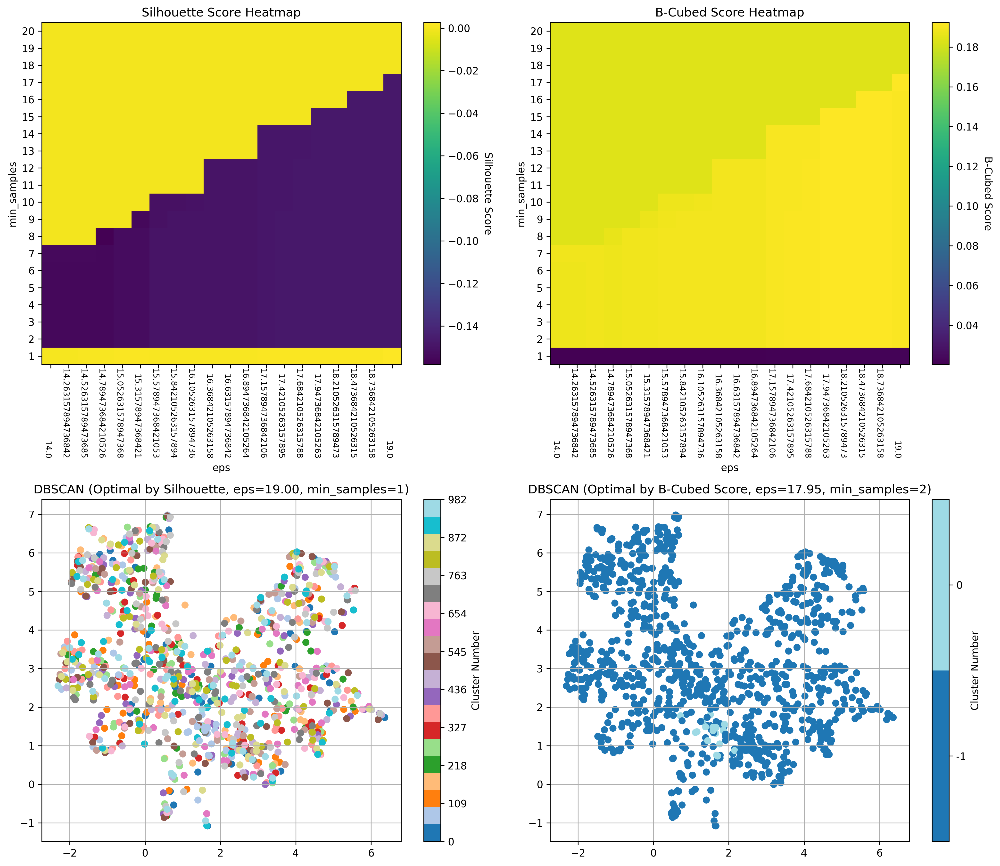

In [ ]:
eps_values = np.linspace(14, 19, 20)
min_samples_values = list(range(1, 21))

sil_scores = []
bcubed_scores = []

for i, ms in enumerate(min_samples_values):
    sil_scores.append([])
    bcubed_scores.append([])
    for j, eps in enumerate(eps_values):
        pred_labels = DBSCAN(eps=eps, min_samples=ms).fit_predict(data_scaled)
        sil_scores[i].append(silhouette_score(data_scaled, pred_labels))
        bcubed_scores[i].append(bcubed_score(labels, pred_labels))

sil_scores = np.array(sil_scores)
best_sil_idx = np.nanargmax(sil_scores)
best_sil_coords = np.unravel_index(best_sil_idx, sil_scores.shape)
best_sil_eps = eps_values[best_sil_coords[1]]
best_sil_min_samples = min_samples_values[best_sil_coords[0]]

bcubed_scores = np.array(bcubed_scores)
best_bcubed_idx = np.nanargmax(bcubed_scores)
best_bcubed_coords = np.unravel_index(best_bcubed_idx, bcubed_scores.shape)
best_bcubed_eps = eps_values[best_bcubed_coords[1]]
best_bcubed_min_samples = min_samples_values[best_bcubed_coords[0]]

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

plot_heatmap(
    sil_scores,
    eps_values,
    min_samples_values,
    axes[0, 0],
    "Silhouette Score Heatmap",
    "Silhouette Score",
)
plot_heatmap(
    bcubed_scores,
    eps_values,
    min_samples_values,
    axes[0, 1],
    "B-Cubed Score Heatmap",
    "B-Cubed Score",
)

plot_2d_data(
    embedding,
    DBSCAN(eps=best_sil_eps, min_samples=best_sil_min_samples).fit_predict(data_scaled),
    title=f"DBSCAN (Optimal by Silhouette, eps={best_sil_eps:.2f}, min_samples={best_sil_min_samples})",
    ax=axes[1, 0],
)

plot_2d_data(
    embedding,
    DBSCAN(eps=best_bcubed_eps, min_samples=best_bcubed_min_samples).fit_predict(
        data_scaled
    ),
    title=f"DBSCAN (Optimal by B-Cubed Score, eps={best_bcubed_eps:.2f}, min_samples={best_bcubed_min_samples})",
    ax=axes[1, 1],
)

plt.tight_layout()
plt.show()

##### Agglomerative Clustering

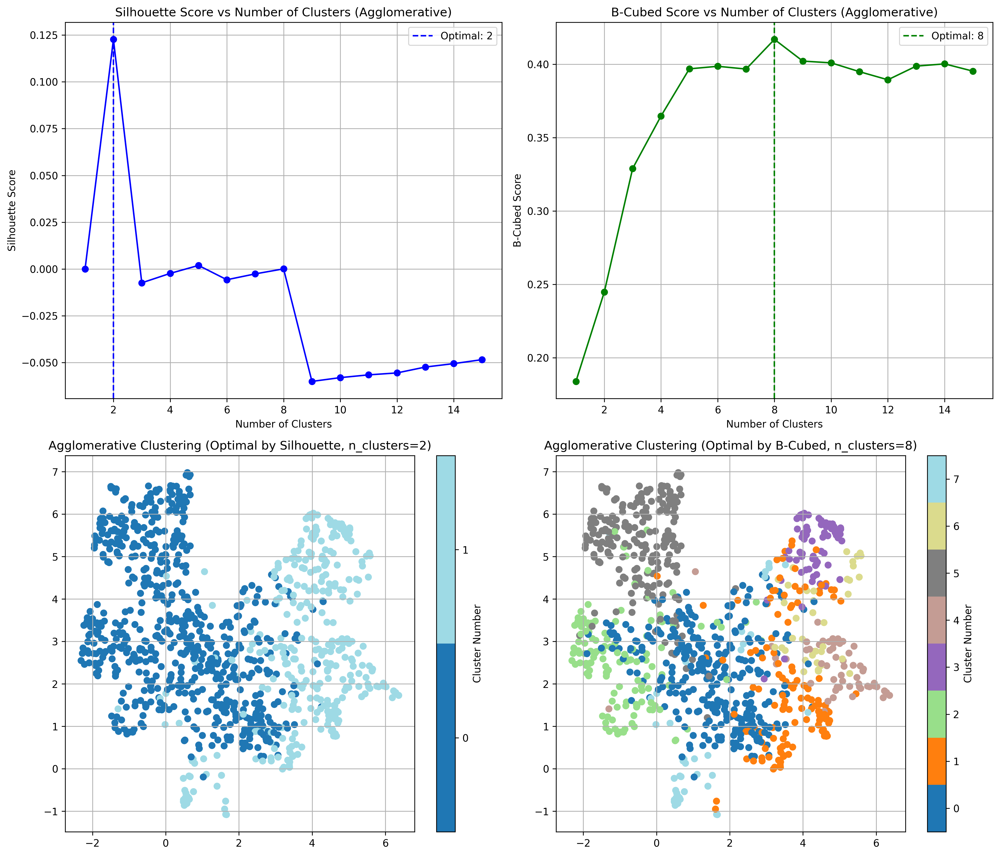

In [ ]:
n_clusters_range = range(1, 16)

silhouette_scores = []
bcubed_scores = []

for n_clusters in n_clusters_range:
    model = AgglomerativeClustering(n_clusters=n_clusters, linkage='ward')
    pred_labels = model.fit_predict(data_scaled)

    sil_score = silhouette_score(data_scaled, pred_labels)
    silhouette_scores.append(sil_score)

    b_score = bcubed_score(labels, pred_labels)
    bcubed_scores.append(b_score)

silhouette_scores = np.array(silhouette_scores)
best_sil_idx = np.argmax(silhouette_scores)
best_sil_clusters = n_clusters_range[best_sil_idx]

bcubed_scores = np.array(bcubed_scores)
best_bcubed_idx = np.argmax(bcubed_scores)
best_bcubed_clusters = n_clusters_range[best_bcubed_idx]

fig, axes = plt.subplots(2, 2, figsize=(14, 12))

axes[0, 0].plot(n_clusters_range, silhouette_scores, marker="o", color="blue")
axes[0, 0].set_title("Silhouette Score vs Number of Clusters (Agglomerative)")
axes[0, 0].set_xlabel("Number of Clusters")
axes[0, 0].set_ylabel("Silhouette Score")
axes[0, 0].grid()
axes[0, 0].axvline(
    best_sil_clusters,
    color="blue",
    linestyle="--",
    label=f"Optimal: {best_sil_clusters}",
)
axes[0, 0].legend()

axes[0, 1].plot(n_clusters_range, bcubed_scores, marker="o", color="green")
axes[0, 1].set_title("B-Cubed Score vs Number of Clusters (Agglomerative)")
axes[0, 1].set_xlabel("Number of Clusters")
axes[0, 1].set_ylabel("B-Cubed Score")
axes[0, 1].grid()
axes[0, 1].axvline(
    best_bcubed_clusters,
    color="green",
    linestyle="--",
    label=f"Optimal: {best_bcubed_clusters}",
)
axes[0, 1].legend()

model_sil = AgglomerativeClustering(n_clusters=best_sil_clusters, linkage='ward')
labels_sil = model_sil.fit_predict(data_scaled)
plot_2d_data(
    embedding,
    labels_sil,
    title=f"Agglomerative Clustering (Optimal by Silhouette, n_clusters={best_sil_clusters})",
    ax=axes[1, 0],
)

model_bcubed = AgglomerativeClustering(n_clusters=best_bcubed_clusters, linkage='ward')
labels_bcubed = model_bcubed.fit_predict(data_scaled)
plot_2d_data(
    embedding,
    labels_bcubed,
    title=f"Agglomerative Clustering (Optimal by B-Cubed, n_clusters={best_bcubed_clusters})",
    ax=axes[1, 1],
)

fig.tight_layout()
plt.show()

#### <font color='DarkOrange'>**Задание 2.8 [кросспроверка, 1 балл][вопрос]** </font>
1. Какие алгоритмы справились с кластеризацией естественных данных?
2. Получилось ли подобрать оптимальное число кластеров с помощью BCubed и коэффициента силуэта?
3. Объясните почему коэффициент силуэта не позволил выполнить подбор оптимальных гиперпараметров.

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>

 1. KMeans и AgglomerativeClustering с подбором числа кластеров по B-Cubed показали адекватное разбиение (8-10 кластеров)  
 DBSCAN не справился: он либо относит почти все точки к шуму, либо образует слишком много кластеров

 2. По B-Cubed — да, для KMeans и AgglomerativeClustering число кластеров близко к реальному  
 По силуэту — нет, для KMeans и AgglomerativeClustering было выделено всего 2 кластера, это не отражает реальную структуру данных

 3. Из-за проклятия размерности расстояния в многомерном пространстве теряют информативность, и коэффициент силуэта не может правильно оценить сложную структуру с большим числом кластеров: в результате он склонен выделять лишь 2 крупных кластера, игнорируя более детальное разбиение

Интересный способ визуализации Иерархической кластеризации — построение дендрограммы. Такой способ визуализации позволяет анализировать, как именно связаны между собой объекты, подбирать оптимальное число кластеров, а также определять, какие классы отделяются "хорошо" от других классов, а какие классы перемешаны в одном кластере.

In [ ]:
def plot_dendrogram(model, labels, classes, ax):
    n_classes = len(classes)
    n_samples = len(model.labels_)
    n_u_connections = model.children_.shape[0]
    colors = plt.get_cmap('tab20', n_classes).colors

    bin_counts = np.zeros([n_u_connections, n_classes])
    for i, merge in enumerate(model.children_):
        current_bin_count = np.zeros(n_classes)
        for child_idx in merge:
            if child_idx < n_samples:
                current_bin_count[labels[child_idx]] += 1
            else:
                current_bin_count += bin_counts[child_idx - n_samples]

        bin_counts[i] = current_bin_count

    linkage_matrix = np.column_stack(
        [model.children_, model.distances_, np.sum(bin_counts, axis=1)]
    ).astype(float)

    def leaf_label_func(idx):
        if idx < len(labels):
            return None
        else:
            ratio = 100 * np.max(bin_counts[idx - n_samples]) / np.sum(bin_counts[idx - n_samples])
            if ratio < 100:
                return '{0:.0f}%'.format(ratio)
            else:
                return None

    def link_color_func(idx):
        mode_class = np.argmax(bin_counts[idx - n_samples])
        return matplotlib.colors.to_hex(colors[mode_class], keep_alpha=True)

    scipy.cluster.hierarchy.dendrogram(
        linkage_matrix, ax=ax, link_color_func=link_color_func, leaf_label_func=leaf_label_func,
        orientation='right', truncate_mode="level", p=9
    )

    for idx, class_name in enumerate(classes):
        ax.plot([], [], c=matplotlib.colors.to_hex(colors[idx], keep_alpha=True), label=class_name)
    ax.legend()

    # Удалим накладывающиеся метки
    threshold = 55
    prev_position = -(threshold + 1)

    y_labels = ax.get_yaxis().get_ticklabels()
    for label in y_labels:
        if label.get_text() == '':
            continue

        _, position = label.get_position()
        if position - prev_position < threshold:
            label.set_text('')
        else:
            prev_position = position
    ax.get_yaxis().set_ticklabels(y_labels)

    ax.set_xlabel('Расстояние между кластерами')
    ax.set_ylabel('Доля объектов наибольшего класса в данном кластере')

    ax.set_title('Дендрограмма Иерархической Кластеризации')

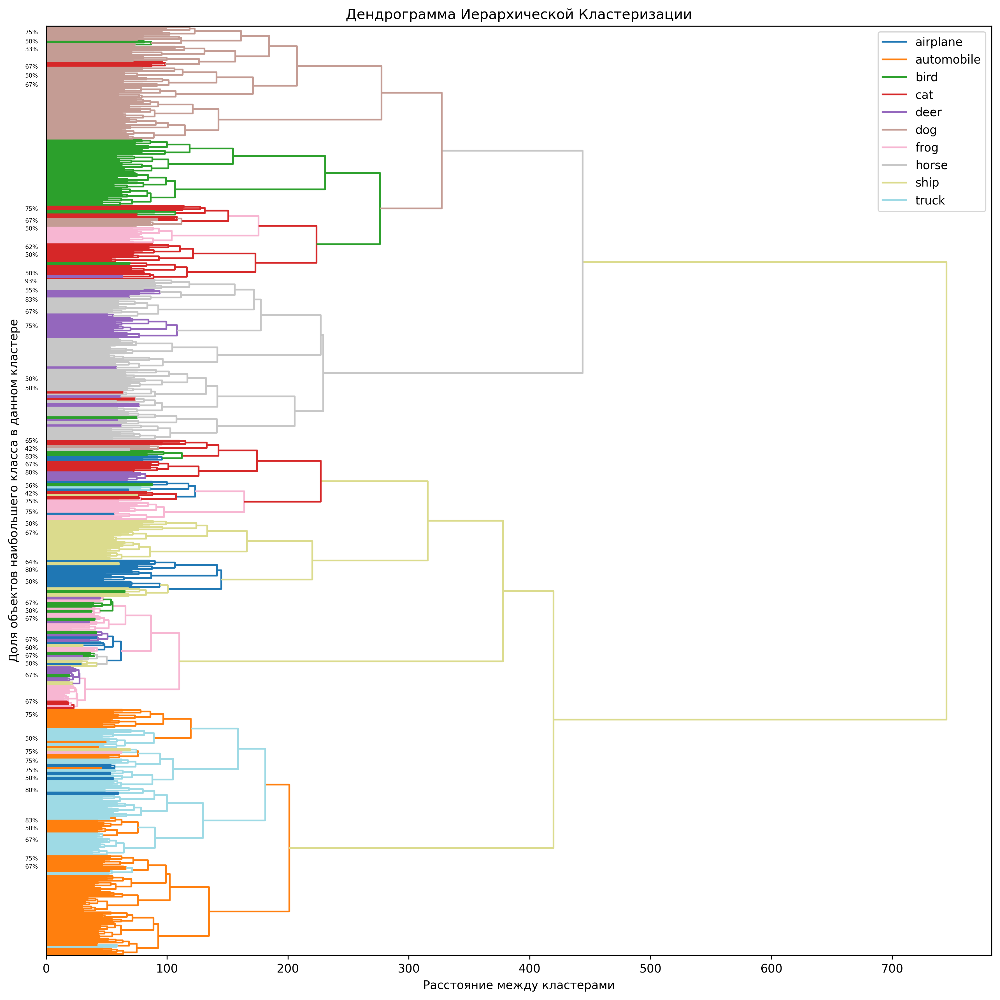

In [ ]:
n_objects = 2000

model = AgglomerativeClustering(
    n_clusters=None, distance_threshold=0.0, compute_distances=True, compute_full_tree=True
)
model = model.fit(cifar10_deep_features_train[:n_objects])

fig, ax = plt.subplots(1, 1, figsize=(12, 12))

plot_dendrogram(
    model,
    labels=cifar10_labels_train[:n_objects],
    classes=cifar10_train_dataset.classes,
    ax=ax
)

fig.tight_layout()
plt.show()

#### <font color='DarkOrange'>**Задание 2.9 [кросспроверка, 0.5 балла][вопрос]** </font>

Проанализируйте получившуюся дендрограмму. Напишите свои наблюдения ниже.

<font color='MediumOrchid'>**Ваш ответ здесь:**</font>  

**Связи между объектами**  
Если объекты объединяются в кластеры на малых расстояниях, это значит, что они очень похожи. Чем дальше происходит объединение объектов, тем они менее похожи между собой   

Сначала формируются исходные группы объектов, потом происходит объединение близких групп по типу авто/грузовик, олень/лошадь. Далее происходит более общее объединение объектов в еще более крупные группы (животные и средства передвижения). Это объединение не происходит идеально: например, часть кошек и лягушек оказываются в группе, в которой преобладают средства передвижения

**Оптимальное число кластеров**  
Хороший выбор — где после объединения групп резко увеличивается длина ветвей, то есть группы достаточно не похожи между собой

В нашем случае это происходит где-то на отметке чуть больше 100. К этому моменту у нас сформированы 10 кластеров, что соответствует числу исходных классов. Дальнейшая длина ветвей начинает все больше увеличиваться

**Отделение от других классов**  
Здесь необходимо посмотреть, насколько классы вообще однородны. Можно, например, посмотреть на проценты частоты в узлах примерно на уровне объединения объектов в районе оптимального числа кластеров

Визуально наиболее однородным и отделимым оказался класс собак  
Авто и грузовики также относительно однородны и отделимы. Однако, например, некоторые подгруппы автомобилей далее объединяются с грузовиками. Это говорит о том, что признаки этих двух классов близки и их достаточно непросто разделить  
Птицы и корабли имеют участки с высокой однородностью, но также встречаются и перемешанные участки  
Остальные группы еще больше перемешаны. Например, лягушки: розовые ветви часто идут рядом с ветвями других цветов и впоследствии объединяются с ними, это говорит о слабой отделимости класса


